In [1]:
import numpy as np
import pandas as pd
import xarray as xr

import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

import cartopy
import cartopy.feature as cfeature
import cartopy.crs as ccrs
import warnings; warnings.filterwarnings('ignore')
import matplotlib.path as mpath

from functions import *
#import sys; sys.path.append("..")
#from dataset_manipulation import *
#from palette import *
#from plot import *

from brl_frst_xpsn.utils.coordinate_operations import *
from brl_frst_xpsn.utils.plot.plot import *
from brl_frst_xpsn.utils.plot.palette import *

plt.rcParams['font.size'] = '15'

In [2]:
casealias = ['CTRL','IDEAL-ON', 'IDEAL-OFF', 'REAL-ON', 'REAL-OFF']
dpi = 300
relative = True
fig_folder = '../../figures/results/'

# Albedo

In [3]:
radiative = load_dataset_dict('RADIATIVE')
land_frac = radiative['CTRL']['LANDFRAC'].isel(time=0)
for case in casealias:
    radiative[case] = fix_radiative_names(radiative[case]).where(land_frac>0.)

In [78]:
def spatial_averages(ds_dict, variable, title, relative = False, vmax_mid = None, vmax_bot = None, savefig=None, **kwargs):
    
    fig, axes = plt.subplots(3,2, figsize=[12,16], subplot_kw={'projection':ccrs.Orthographic(0, 90)})

    #plot_args = dict(cbar_kwargs={'extend':'both'}, **kwargs)

    if kwargs['vmax']: vmax = kwargs['vmax']
    for i, cases in enumerate([['IDEAL-ON', 'CTRL'], ['REAL-ON', 'CTRL'], ['IDEAL-ON', 'IDEAL-OFF'], ['REAL-ON', 'REAL-OFF'], ['IDEAL-OFF', 'CTRL'], ['REAL-OFF', 'CTRL']]):
        if vmax_mid and (i==2 or i ==3): kwargs['vmax'] = vmax_mid
        if vmax_bot and (i==4 or i ==5): kwargs['vmax'] = vmax_bot
        plot_difference_map(ds_dict, cases[0], cases[1], variable, ax=axes.flat[i], relative=relative, **kwargs)
        if vmax: kwargs['vmax'] = vmax
        else: kwargs['vmax'] = None
        
    plt.suptitle(title)
    if not savefig:
        figtitle = fig_folder+variable
    else: figtitle = fig_folder+savefig
    if relative: figtitle=figtitle+'_relative'
    plt.savefig(figtitle+'.pdf', pad_inches=0.5, bbox_inches='tight')
    plt.show()

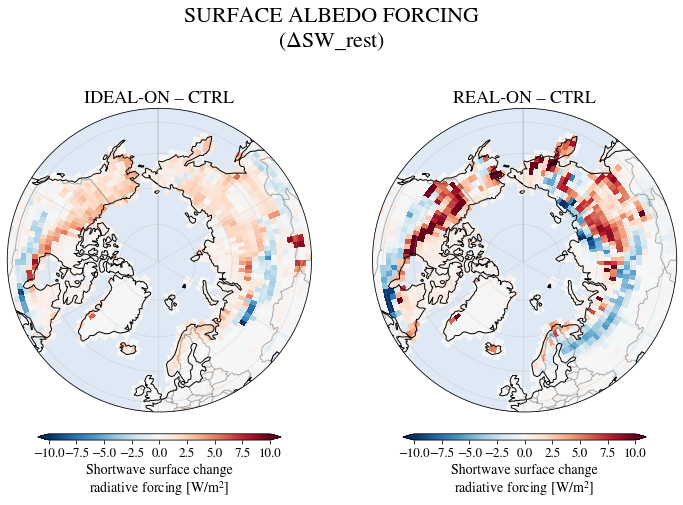

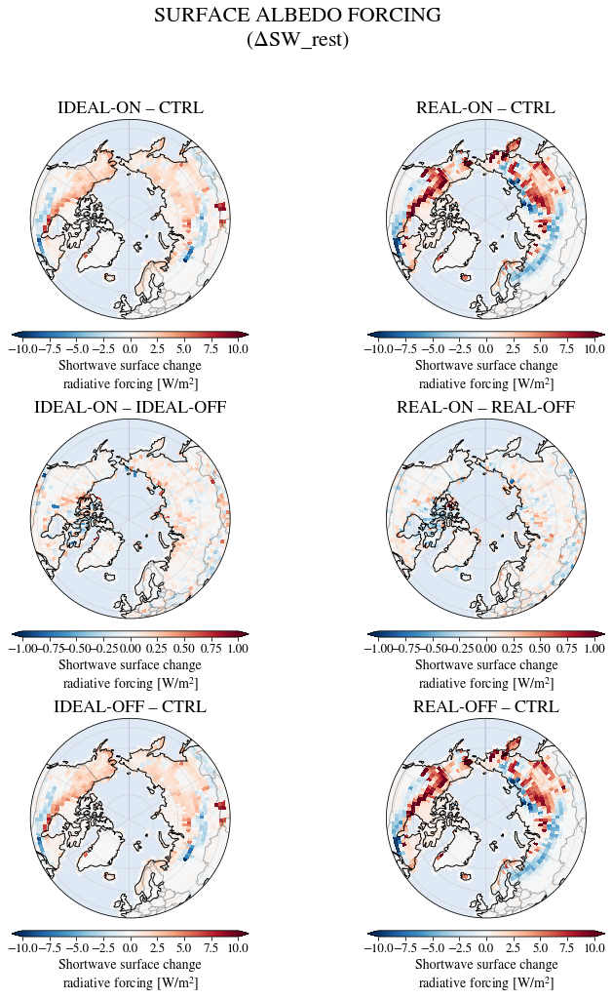

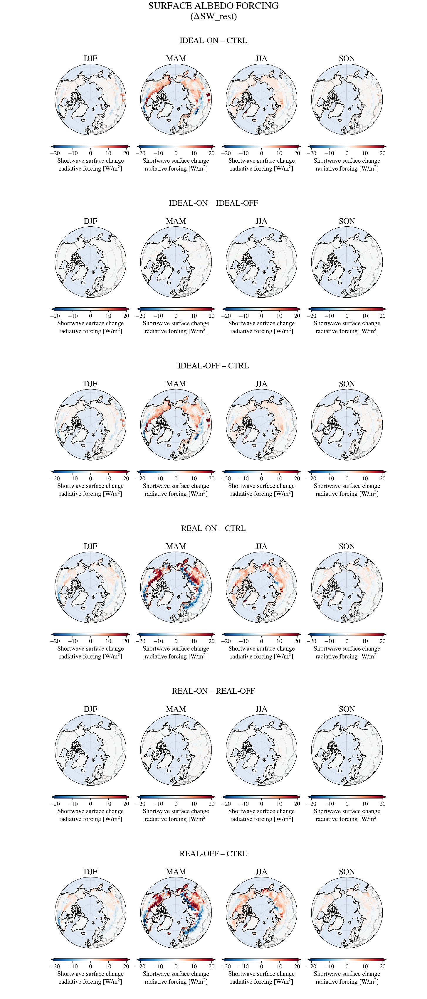

In [84]:
ds = radiative
var='SW_rest'
title=f'SURFACE ALBEDO FORCING\n($\Delta$SW_rest)'
vmax=10

fig, axes = plt.subplots(1,2, figsize=[12,8], subplot_kw={'projection':ccrs.Orthographic(0, 90)})

plot_difference_map(ds, 'IDEAL-ON', 'CTRL', var, ax=axes.flat[0], vmax=vmax)
plot_difference_map(ds, 'REAL-ON', 'CTRL', var, ax=axes.flat[1], vmax = vmax)
plt.suptitle(title)
plt.show()

spatial_averages(radiative, var, title, relative=False, vmax = vmax, vmax_mid = 1, savefig='SW_rest_ALBEDO')
spatial_averages_4seasons(ds, var, title, dpi=dpi, vmax=20, savefig='SW_rest_ALBEDO')

# PFT cover

In [102]:
land = load_dataset_dict('LAND', cases=['CTRL', 'IDEAL-ON', 'REAL-ON'])

In [6]:
def plot_difference_natpft(da_dict, case1, case2, variable,title, cmap='RdBu_r', **kwargs):
    
    fig, axes = plt.subplots(7,2, figsize=[12,42], subplot_kw={'projection':ccrs.Orthographic(0, 90)})#,dpi=100)
    diff = (da_dict[case1][variable].mean('time')-da_dict[case2][variable].mean('time'))
    
    #natpft_names=['BoNET', 'BoNDT', 'BoBDT', 'Bo shrubs', 'artic C3 grass']
    for i, n in enumerate(range(0,14)):#[2,3,8,11,12, 13]):
        #if n==13: axes.flat[i].axis('off')
        #else: 
        boreal_map(diff.sel(natpft=n), ax = axes.flat[i], title=i, cmap=cmap,
                           extent_lat =45., vmax=50, vmin = -50,**kwargs)
    plt.suptitle(title+': '+case1+' – '+case2)
    plt.show()  

In [147]:
fig_folder = '../../figures/results/'
def plot_difference_natpft(da_dict, case1, case2, variable,title, cmap=cmap, vmax = None, figtitle=None, **kwargs):
    
    fig, axes = plt.subplots(2,4, figsize=[20,12], subplot_kw={'projection':ccrs.Orthographic(0, 90)})#,dpi=100)
    diff = (da_dict[case1][variable].mean('time')-da_dict[case2][variable].mean('time'))
    diff = diff.assign_attrs(dict(long_name='% of the PFT on the natural vegetation landunit'))
    
    natpft_names=['1 - TeNET', '2 - BoNET', '3 - BoNDT', '5 - TeBET', '7 - TeBDT', '8 - BoBDT', '11 - BoBDS', '12 - aC3']
    for i, n in enumerate([1,2,3,5, 7, 8,11,12]):
        #if n==13: axes.flat[i].axis('off')
        #else: 
        boreal_map(diff.sel(natpft=n), ax = axes.flat[i], title=natpft_names[i], cmap=cmap,
                               extent_lat =45., vmax=vmax, vmin = -vmax,**kwargs)
    plt.suptitle(title)
    plt.savefig(fig_folder+figtitle+'.pdf', pad_inches=0.5, bbox_inches='tight')
    plt.show() 
    
def plot_natpft(da_dict, case, variable,title, cmap=cmap, vmax = None, figtitle=None, **kwargs):
    
    fig, axes = plt.subplots(2,4, figsize=[20,12], subplot_kw={'projection':ccrs.Orthographic(0, 90)})#,dpi=100)
    diff = da_dict[case][variable].mean('time')
    diff = diff.assign_attrs(dict(long_name='% of the PFT on the natural vegetation landunit'))
    
    natpft_names=['1 - TeNET', '2 - BoNET', '3 - BoNDT', '5 - TeBET', '7 - TeBDT', '8 - BoBDT', '11 - BoBDS', '12 - aC3']
    for i, n in enumerate([1,2,3,5, 7, 8,11,12]):
        #if n==13: axes.flat[i].axis('off')
        #else: 
        boreal_map(diff.sel(natpft=n), ax = axes.flat[i], title=natpft_names[i], cmap=cmap,
                               extent_lat =45., vmax=vmax, vmin = 0, **kwargs)
    plt.suptitle(title)
    plt.savefig(fig_folder+figtitle+'.pdf', pad_inches=0.5, bbox_inches='tight')
    plt.show() 

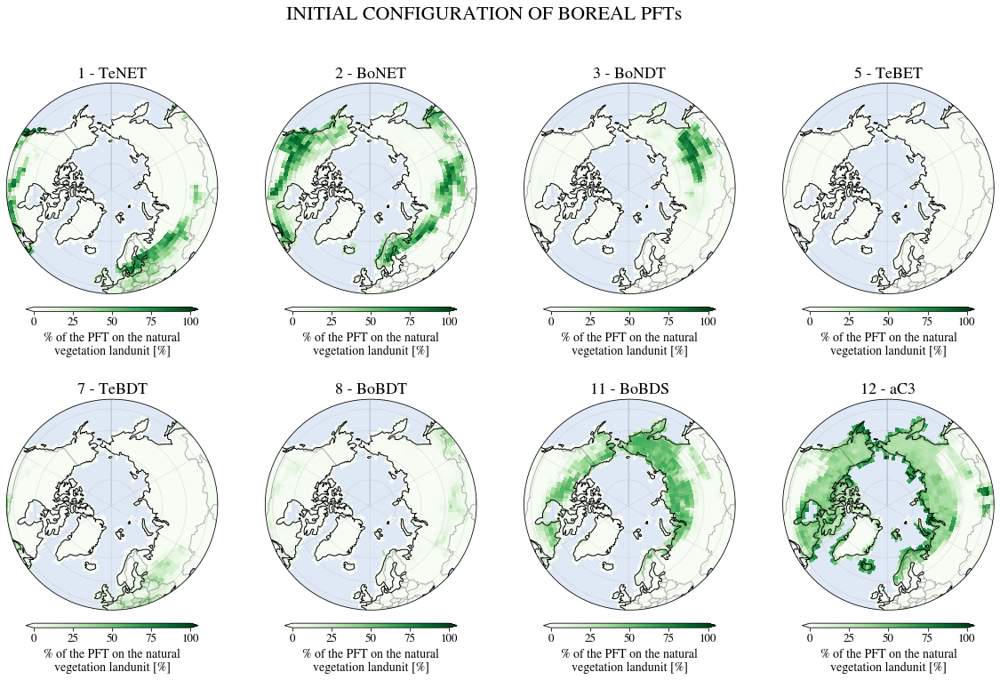

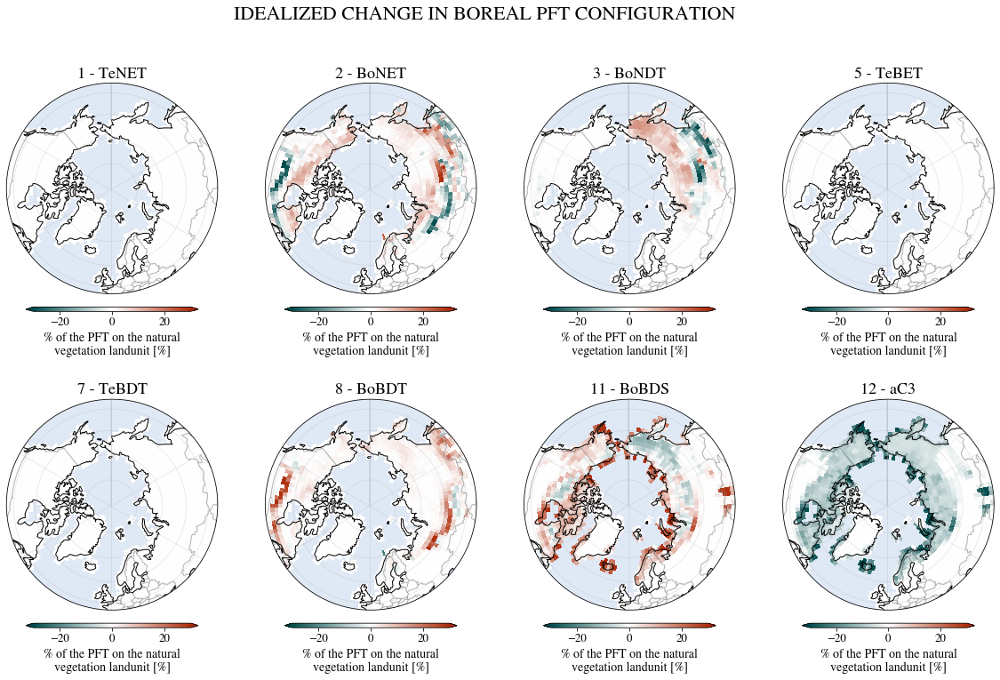

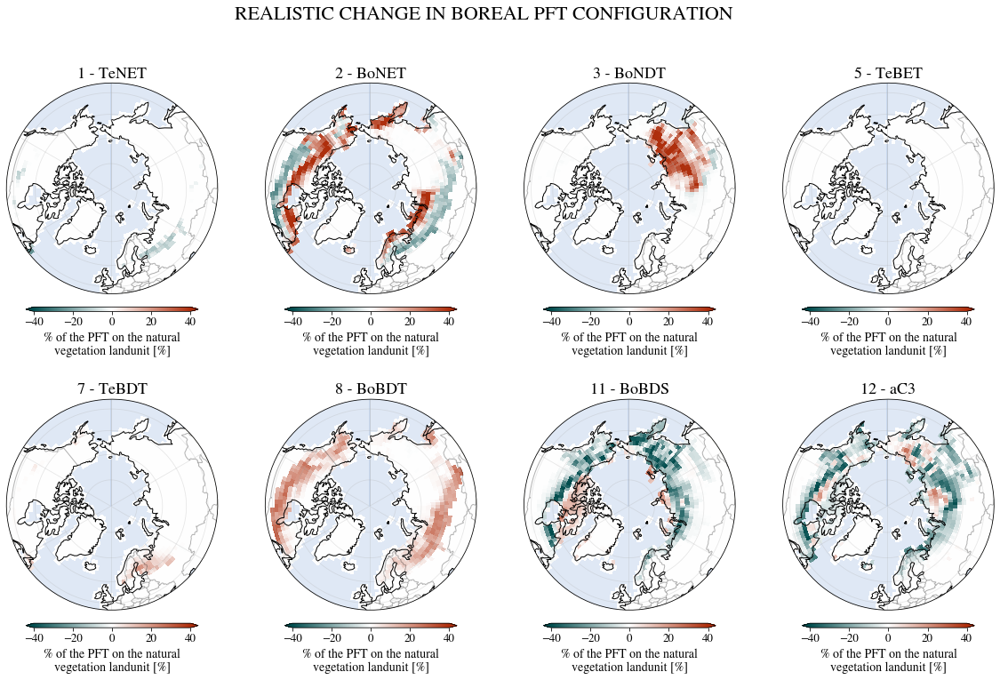

In [149]:
plt.rcParams['font.size'] = '25'
cmap=diverging_colormap('#014d4e', '#af2f0d')

plot_natpft(land, 'CTRL', 'PCT_NAT_PFT', 'INITIAL CONFIGURATION OF BOREAL PFTs', cmap='Greens', figtitle = 'initial_config2', vmax =100)

plot_difference_natpft(land, 'IDEAL-ON', 'CTRL', 'PCT_NAT_PFT', 'IDEALIZED CHANGE IN BOREAL PFT CONFIGURATION', cmap=cmap, figtitle = 'change_idealized2', vmax =30)
plot_difference_natpft(land, 'REAL-ON', 'CTRL', 'PCT_NAT_PFT', 'REALISTIC CHANGE IN BOREAL PFT CONFIGURATION', cmap=cmap, figtitle = 'change_realistic2', vmax=40)

# Evapotranspiration

In [67]:
et = load_dataset_dict('ET')
et = fix_et(et)

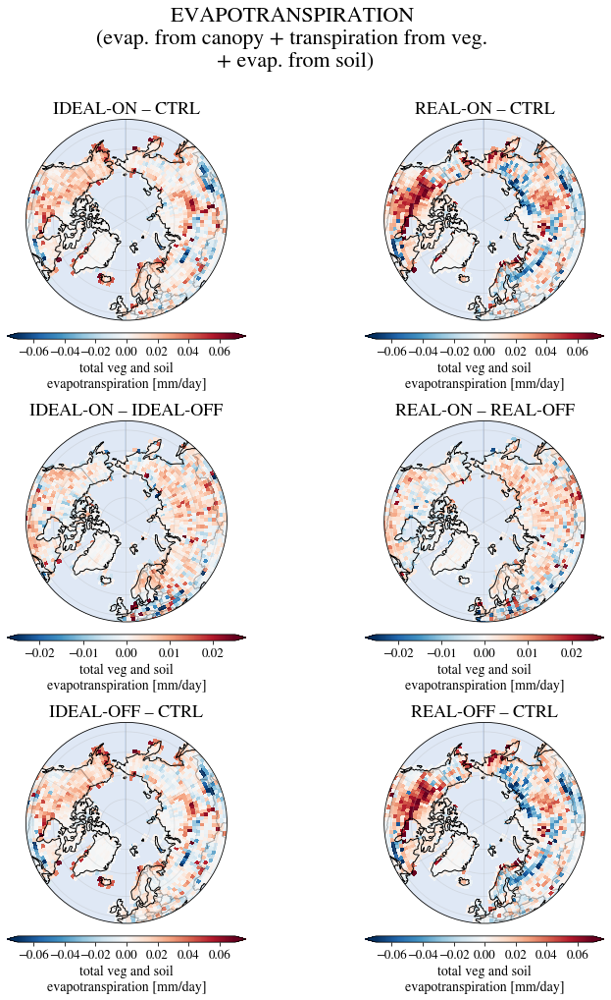

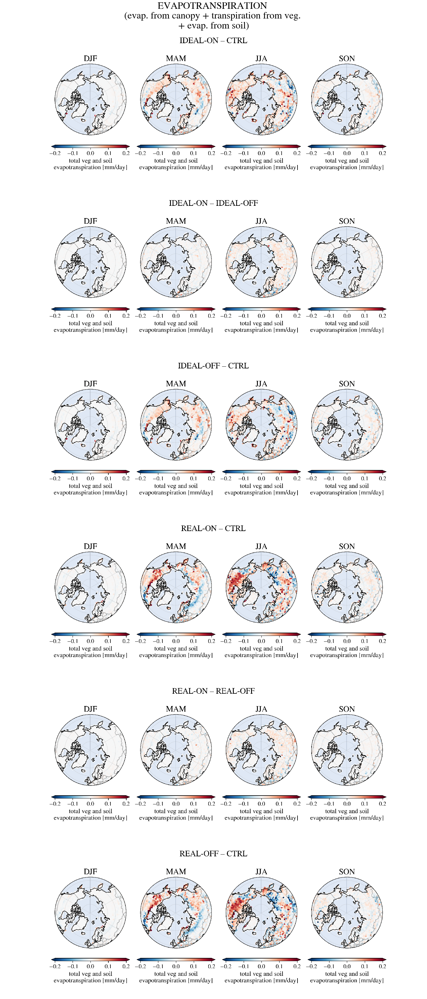

In [80]:
ds=et
variable='QFLX_EVAP_TOT'
title = 'EVAPOTRANSPIRATION \n(evap. from canopy + transpiration from veg. \n+ evap. from soil)'
relative=False
spatial_averages(ds, variable, title, vmax=0.07 if not relative else 15, vmax_mid = 0.025, relative = relative)
#spatial_averages_winter_summer(ds, variable, title, dpi=dpi, vmax=0.2 if not relative else 25, relative = relative)
spatial_averages_4seasons(ds, variable, title, dpi=dpi, vmax=0.2 if not relative else 25, relative = relative)
#, cbar_kwargs = dict(ticks=[-1000, -500, 0, 500, 1000]))

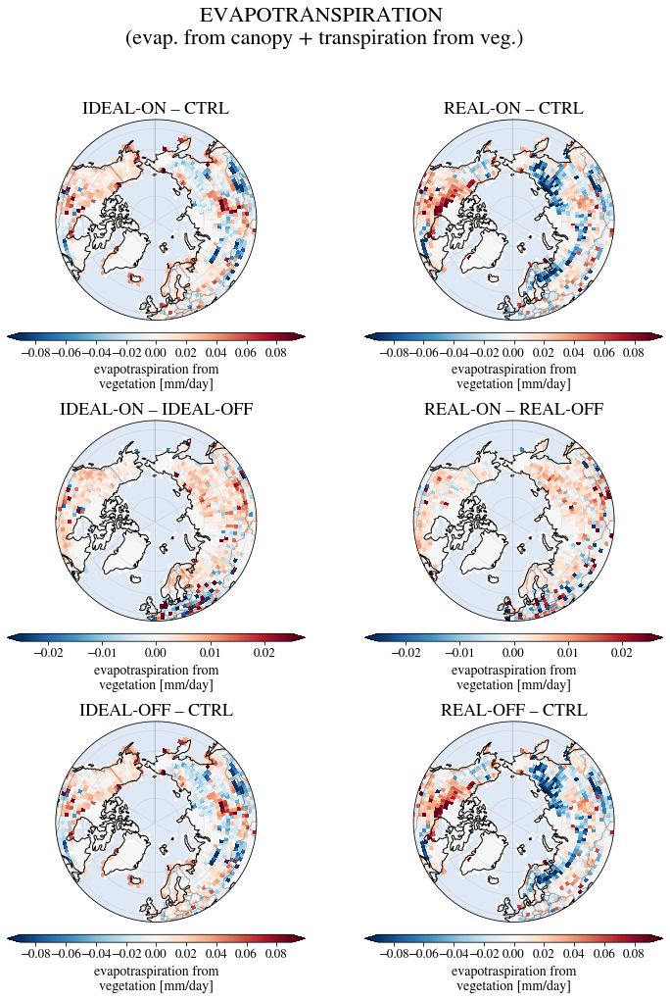

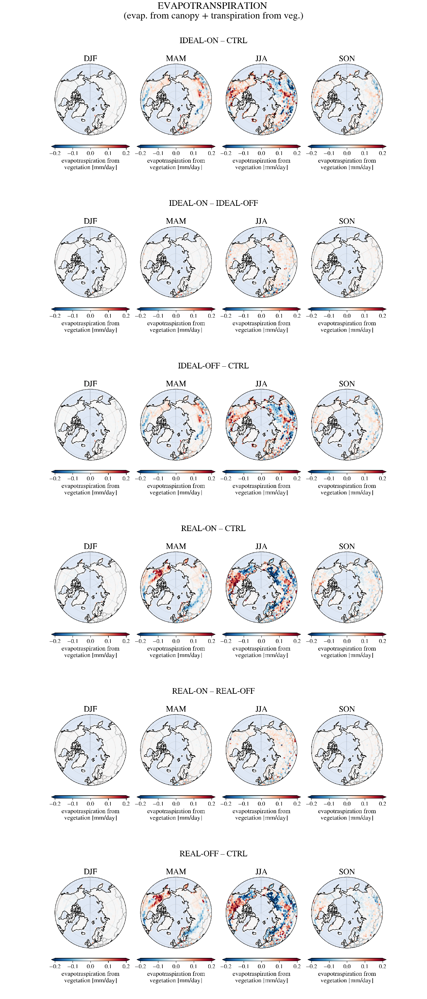

In [81]:
ds=et
variable='QFLX_EVAP'
title = 'EVAPOTRANSPIRATION \n(evap. from canopy + transpiration from veg.)'
relative=False
spatial_averages(ds, variable, title, vmax=0.09 if not relative else 15, vmax_mid = 0.025, relative = relative, cbar_kwargs=dict(shrink=1.))
#spatial_averages_winter_summer(ds, variable, title, dpi=dpi, vmax=0.2 if not relative else 25, relative = relative)
#spatial_averages_4seasons(ds, variable, title, dpi=dpi, vmax=0.2 if not relative else 25, relative = relative)
#, cbar_kwargs = dict(ticks=[-1000, -500, 0, 500, 1000]))

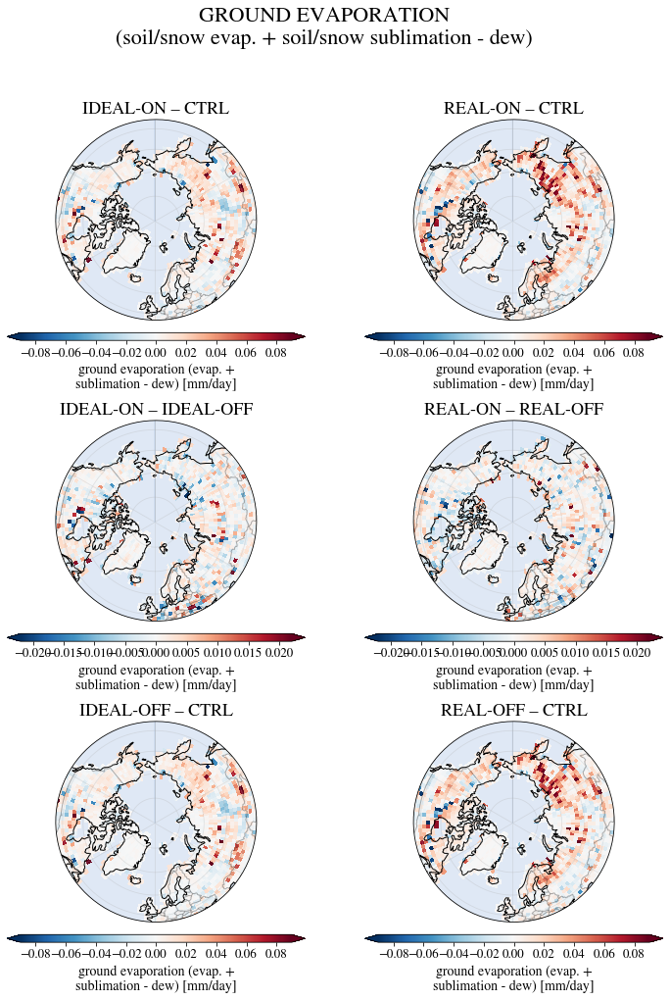

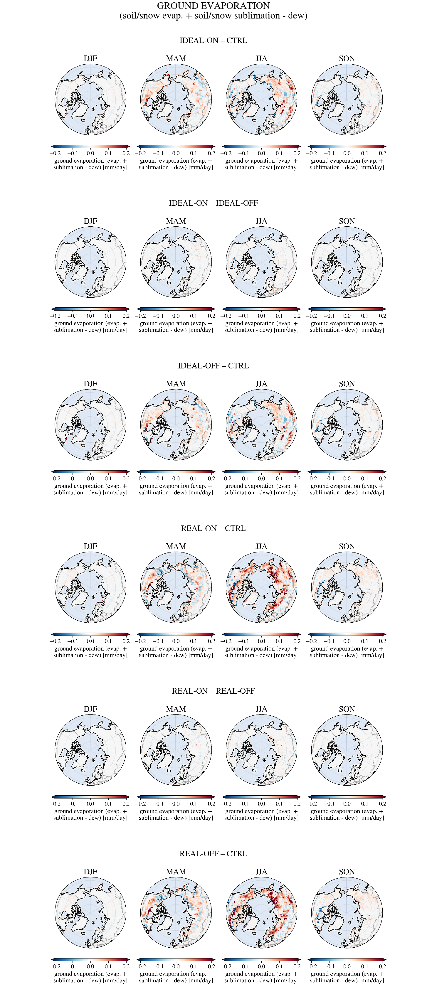

In [79]:
ds=et
variable='QSOIL'
title = 'GROUND EVAPORATION\n(soil/snow evap. + soil/snow sublimation - dew)'
relative=False

for case in casealias:
    ds[case][variable] = ds[case][variable].assign_attrs(dict(long_name='ground evaporation (evap. + sublimation - dew)'))
    
spatial_averages(ds, variable, title, vmax=0.09 if not relative else 15, vmax_mid = 0.025, relative = relative, cbar_kwargs=dict(shrink=1.))
#spatial_averages_winter_summer(ds, variable, title, dpi=dpi, vmax=0.2 if not relative else 25, relative = relative)
#spatial_averages_4seasons(ds, variable, title, dpi=dpi, vmax=0.2 if not relative else 25, relative = relative)
#, cbar_kwargs = dict(ticks=[-1000, -500, 0, 500, 1000]))

In [96]:
def time_average(da_dict, case, variable):
    da = da_dict[case][variable].mean('time')
    return da

def relative_difference(da_dict, case1, case2, variable):
    da1 = time_average(da_dict, case1, variable)
    da2 = time_average(da_dict, case2, variable)
    diff = (da1-da2)#/da2*100
    return diff
    
relative_difference(radiative, 'REAL-ON', 'CTRL', 'SW_rest').max()
relative_difference(et, 'REAL-ON', 'CTRL', 'QFLX_EVAP_TOT').max()

<xarray.DataArray 'QFLX_EVAP_TOT' ()>
array(0.26935407)
Attributes:
    long_name:     total veg and soil evapotranspiration
    units:         mm/day
    cell_methods:  time: mean
    CLM5_name:     QFLX_EVAP_TOT

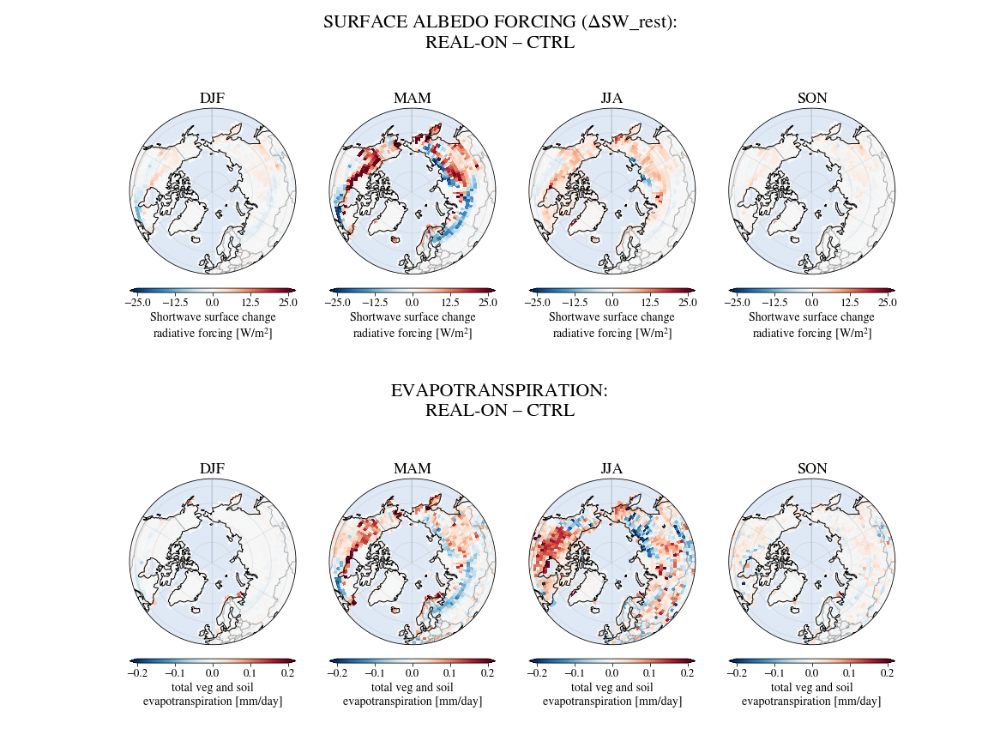

In [85]:
fig_folder = '../../figures/results/'

##### FIGURE FOR THE THESIS
backend = mpl.get_backend()
mpl.use('agg')

figs = []
fig = plot_difference_map_4seasons(radiative, 'REAL-ON', 'CTRL', 'SW_rest', 'SURFACE ALBEDO FORCING ($\Delta$SW_rest)', 
                                   vmax=25, figsize=[16,6], relative=False, cbar_kwargs=dict(shrink=1.))
figs.append(fig)
fig = plot_difference_map_4seasons(et, 'REAL-ON', 'CTRL', 'QFLX_EVAP_TOT', 
                                   'EVAPOTRANSPIRATION', relative =False,
                                   vmax=0.2, figsize=[16,6], cbar_kwargs=dict(shrink=1.))
figs.append(fig)

a_list = []
for fig in figs:
    c = fig.canvas
    c.draw()
    a_list.append(np.array(c.buffer_rgba()))

a = np.vstack(a_list)

mpl.use(backend)
fig,ax = plt.subplots(figsize=[16,15])
fig.subplots_adjust(0, 0, 1, 1)
ax.set_axis_off()
ax.matshow(a)
figtitle = fig_folder+'ALBEDO_ET_seasons'
plt.savefig(figtitle+'.pdf', bbox_inches='tight', pad_inches=0)
plt.show()


NameError: name 'single_pft_map' is not defined

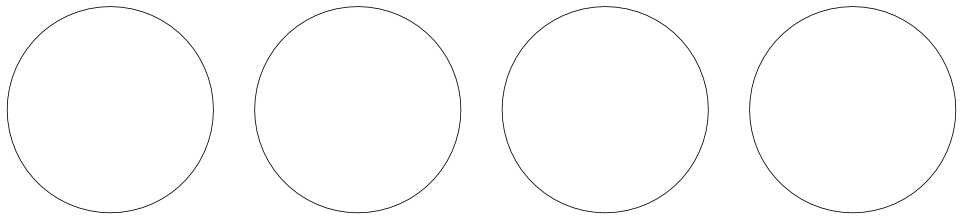

In [20]:
def plot_difference(da_dict, case1, case2, variable, ax = None, lev=False, **kwargs):
    
    diff = (da_dict[case1][variable].mean('time')-da_dict[case2][variable].mean('time'))#/da_dict[case2][variable].groupby('time.year').sum('time').mean('year')
    if lev: diff=diff.sum('lev').where(da_dict[case1].LANDFRAC.mean('time')>0.)
    single_pft_map(diff, ax = ax, title=case1+' – '+case2, cmap='RdBu_r', extent_lat =45.,**kwargs)
        
def plot_difference_by_season(da_dict, case1, case2, variable, title, lev=False,**kwargs):
    seasons = ['DJF', 'MAM', 'JJA', 'SON']
    
    diff = (da_dict[case1][variable].groupby('time.season').mean('time')-da_dict[case2][variable].groupby('time.season').mean('time'))
    if lev: diff=diff.sum('lev').where(da_dict[case1].LANDFRAC.mean('time')>0.)
        
    fig, axes = plt.subplots(1,4, figsize=[17,5], subplot_kw={'projection':ccrs.Orthographic(0, 90)})#,dpi=100)
    
    for i, season in enumerate(seasons):
        single_pft_map(diff.sel(season=season), ax = axes.flat[i], title=season, cmap='RdBu_r', extent_lat =45.,**kwargs)
    plt.suptitle(title+': '+case1+' – '+case2, size=15)
    plt.show()
    
plot_difference_by_season(ds, 'IDEAL-ON', 'CTRL', var, title, vmax=50)
plot_difference_by_season(ds, 'REAL-ON', 'CTRL', var, title, vmax=50)

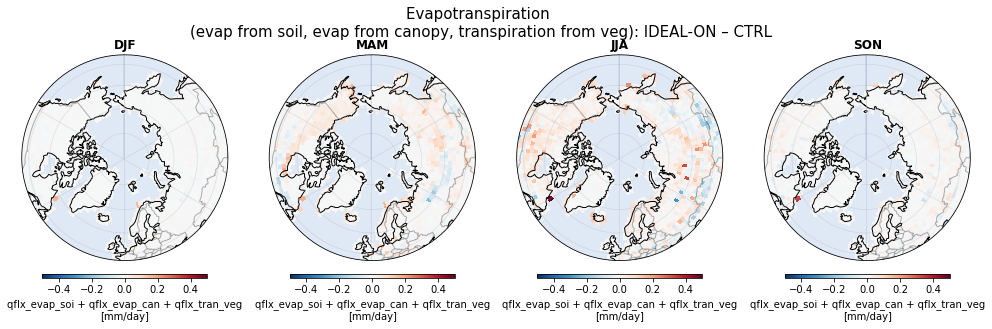

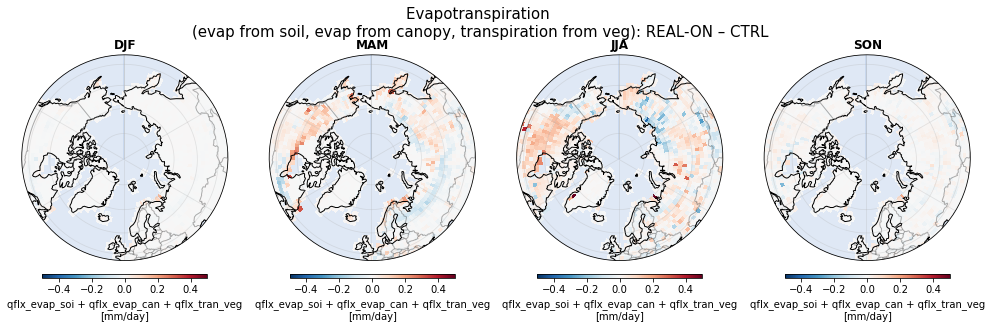

In [62]:
plot_difference_by_season(ds, 'IDEAL-ON', 'CTRL', var, title, vmax=0.5)
plot_difference_by_season(ds, 'REAL-ON', 'CTRL', var, title, vmax=0.5)